# Oliver Jack

# 1. Variational Autoencoders

## Import libraries

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import requests
import os
import gzip
import shutil
import matplotlib.pyplot as plt

## Download MNIST datasets

In [23]:
urls = [
    "https://storage.googleapis.com/cvdf-datasets/mnist/train-images-idx3-ubyte.gz",
    "https://storage.googleapis.com/cvdf-datasets/mnist/train-labels-idx1-ubyte.gz",
    "https://storage.googleapis.com/cvdf-datasets/mnist/t10k-images-idx3-ubyte.gz",
    "https://storage.googleapis.com/cvdf-datasets/mnist/t10k-labels-idx1-ubyte.gz"
]

save_dir = "./data/MNIST/raw/"
os.makedirs(save_dir, exist_ok=True)

for url in urls:
    filename = os.path.join(save_dir, url.split("/")[-1])
    print(f"Downloading {url} to {filename}...")
    response = requests.get(url)
    with open(filename, "wb") as f:
        f.write(response.content)

## Unzip datasets

In [24]:
raw_dir = "./data/MNIST/raw/"
for file in os.listdir(raw_dir):
    if file.endswith(".gz"):
        with gzip.open(os.path.join(raw_dir, file), 'rb') as f_in:
            with open(os.path.join(raw_dir, file[:-3]), 'wb') as f_out:
                shutil.copyfileobj(f_in, f_out)
        os.remove(os.path.join(raw_dir, file))

## Binarize images

In [25]:
class BinarizeTransform:
    def __call__(self, img):
        return (img >= 0.5).float()
    
transform = transforms.Compose([
    transforms.ToTensor(),
    BinarizeTransform()
])

train_dataset = datasets.MNIST(root='./data', train=True, download=False, transform=transform)
test_dataset = datasets.MNIST(root='./data', train=False, download=False, transform=transform)

## Encoder

In [26]:
class Encoder(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=256, z_dim=20):
        super(Encoder, self).__init__()

        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)

        self.fc_mu = nn.Linear(hidden_dim, z_dim)
        self.fc_logvar = nn.Linear(hidden_dim, z_dim)

        self.relu = nn.ReLU()
    
    def forward(self, x):

        h = self.relu(self.fc1(x))
        h = self.relu(self.fc2(h))
        h = self.relu(self.fc3(h))

        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)

        return mu, logvar

## Decoder

In [27]:
class Decoder(nn.Module):
    def __init__(self, z_dim=20, hidden_dim=256, output_dim=784):
        super(Decoder, self).__init__()

        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)

        self.fc_output = nn.Linear(hidden_dim, output_dim)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, z):

        h = self.relu(self.fc1(z))
        h = self.relu(self.fc2(h))
        h = self.relu(self.fc3(h))

        x_recon = self.sigmoid(self.fc_output(h))

        return x_recon

## Variational autoencoder

In [28]:
class VAE(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=256, z_dim=20):
        super(VAE, self).__init__()
        self.encoder = Encoder(input_dim, hidden_dim, z_dim)
        self.decoder = Decoder(z_dim, hidden_dim, input_dim)
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.rand_like(std)
        return mu + eps * std

    def forward(self, x):
        x = x.view(x.size(0), -1)

        mu, logvar = self.encoder.forward(x)

        z = self.reparameterize(mu, logvar)

        x_recon = self.decoder.forward(z)

        return x_recon, mu, logvar

## Variational autoencoder loss

In [29]:
def vae_loss(x, x_recon, mu, logvar):
    recon_loss = F.binary_cross_entropy(x_recon, x, reduction='sum')
    
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    total_loss = recon_loss + kl_loss
    
    return total_loss, recon_loss, kl_loss

## Training

In [30]:
batch_size = 64
learning_rate = 1e-3
num_epochs = 100

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

vae = VAE(input_dim=784, hidden_dim=256, z_dim=20)
optimizer = optim.Adam(vae.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    vae.train()
    total_epoch_loss = 0
    total_recon_loss = 0
    total_kl_loss = 0

    for x, _ in train_loader:
        x = x.view(x.size(0), -1)

        x_recon, mu, logvar = vae.forward(x)

        epoch_loss, recon_loss, kl_loss = vae_loss(x, x_recon, mu, logvar)

        optimizer.zero_grad()
        epoch_loss.backward()
        optimizer.step()

        total_epoch_loss += epoch_loss.item()
        total_recon_loss += recon_loss.item()
        total_kl_loss += kl_loss.item()

    avg_epoch_loss = total_epoch_loss / len(train_loader.dataset)
    avg_recon_loss = total_recon_loss / len(train_loader.dataset)
    avg_kl_loss = total_kl_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_epoch_loss:.4f}, Recon Loss: {avg_recon_loss:.4f}, KL Loss: {avg_kl_loss:.4f}")

Epoch [1/100], Loss: 166.7265, Recon Loss: 163.6858, KL Loss: 3.0407
Epoch [2/100], Loss: 116.2951, Recon Loss: 110.3242, KL Loss: 5.9710
Epoch [3/100], Loss: 101.5406, Recon Loss: 94.3983, KL Loss: 7.1423
Epoch [4/100], Loss: 93.8049, Recon Loss: 86.0210, KL Loss: 7.7838
Epoch [5/100], Loss: 87.8597, Recon Loss: 79.4931, KL Loss: 8.3666
Epoch [6/100], Loss: 83.7846, Recon Loss: 74.9944, KL Loss: 8.7901
Epoch [7/100], Loss: 80.9540, Recon Loss: 71.8025, KL Loss: 9.1514
Epoch [8/100], Loss: 78.4431, Recon Loss: 68.9997, KL Loss: 9.4434
Epoch [9/100], Loss: 76.5404, Recon Loss: 66.8438, KL Loss: 9.6966
Epoch [10/100], Loss: 74.9871, Recon Loss: 65.1111, KL Loss: 9.8760
Epoch [11/100], Loss: 73.7067, Recon Loss: 63.6732, KL Loss: 10.0335
Epoch [12/100], Loss: 72.5622, Recon Loss: 62.3898, KL Loss: 10.1724
Epoch [13/100], Loss: 71.5367, Recon Loss: 61.2097, KL Loss: 10.3270
Epoch [14/100], Loss: 70.5748, Recon Loss: 60.1043, KL Loss: 10.4705
Epoch [15/100], Loss: 69.8468, Recon Loss: 59.28

## Reconstructed images for different models

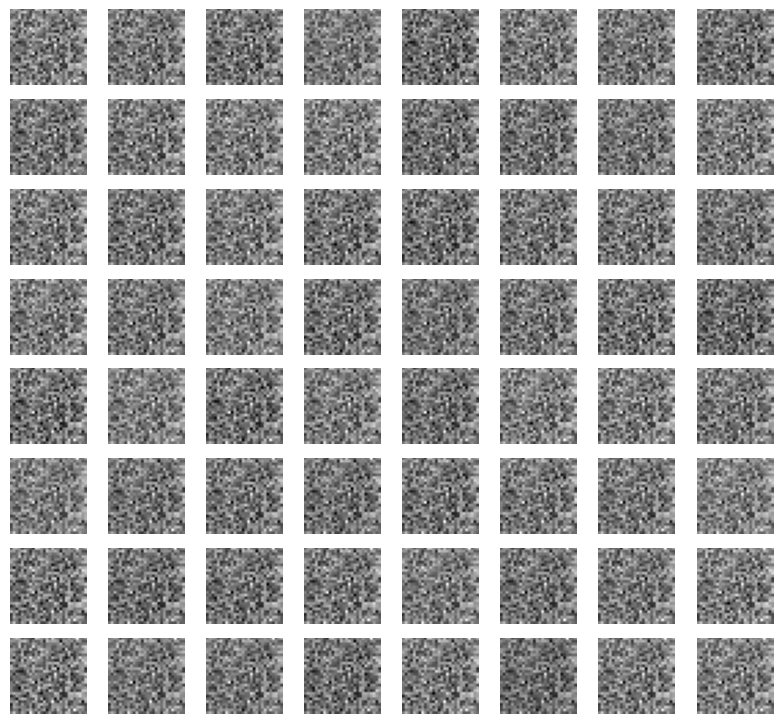

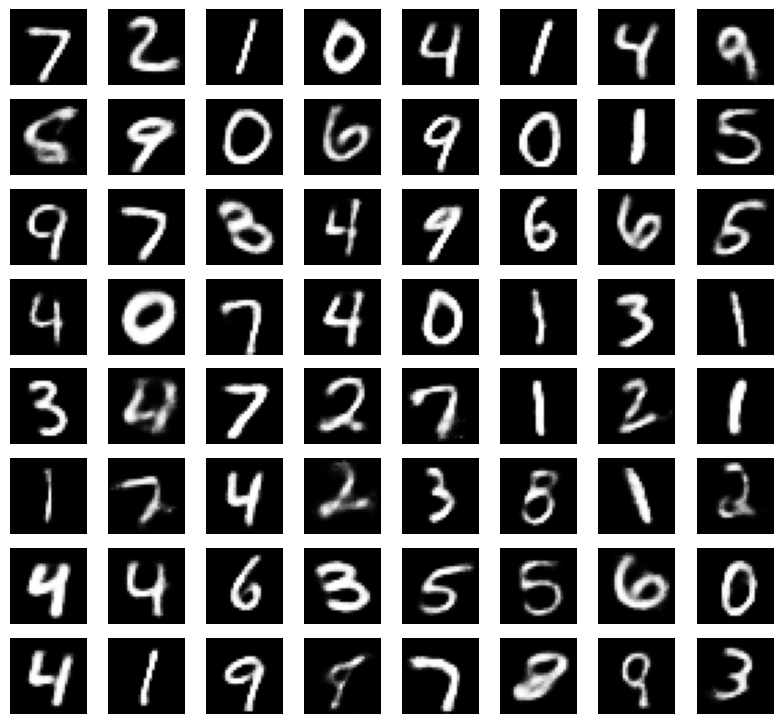

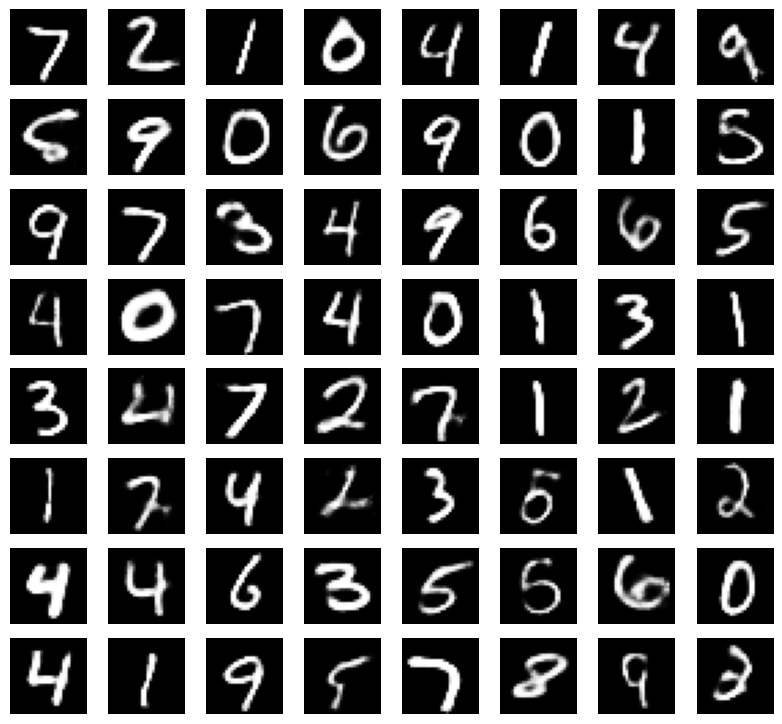

In [31]:
num_epochs = [0, 10, 80]

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

vae.eval()
with torch.no_grad():
    test_images, _ = next(iter(test_loader))
    test_images = test_images.view(test_images.size(0), -1)

reconstructed_samples = {}

for epochs in num_epochs:
    vae = VAE(input_dim=784, hidden_dim=256, z_dim=20)
    optimizer = optim.Adam(vae.parameters(), lr=learning_rate)
    
    for epoch in range(epochs):
        vae.train()
        for x, _ in train_loader:
            x = x.view(x.size(0), -1)

            x_recon, mu, logvar = vae(x)

            loss, recon_loss, kl_loss = vae_loss(x, x_recon, mu, logvar)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
    
    vae.eval()
    with torch.no_grad():
        mu, logvar = vae.encoder(test_images)
        z = vae.reparameterize(mu, logvar)
        reconstructions = vae.decoder(z).cpu()
        reconstructed_samples[epochs] = reconstructions.view(-1, 28, 28)

for epochs in num_epochs:
    images = reconstructed_samples[epochs].numpy()

    fig, axes = plt.subplots(8, 8, figsize=(8, 8))

    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i], cmap="gray")
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# 2. Difffusion

## Import libraries

In [1]:
import torch
from diffusers import StableDiffusionPipeline, LMSDiscreteScheduler, EulerDiscreteScheduler, EulerAncestralDiscreteScheduler, DPMSolverMultistepScheduler
import matplotlib.pyplot as plt

## Prepare pipeline

In [2]:
pipeline = StableDiffusionPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
)

pipeline = pipeline.to("mps")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Specify prompt

In [3]:
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."

## LMSDiscreteScheduler

### After 10 steps

  0%|          | 0/10 [00:00<?, ?it/s]

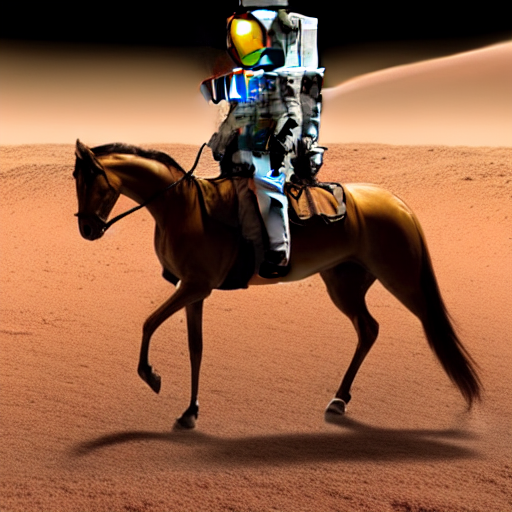

In [4]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = LMSDiscreteScheduler().from_config(pipeline.scheduler.config)
image_lmsds_10 = pipeline(prompt, generator=generator, num_inference_steps=10).images[0]
image_lmsds_10

### After 100 steps

  0%|          | 0/100 [00:00<?, ?it/s]

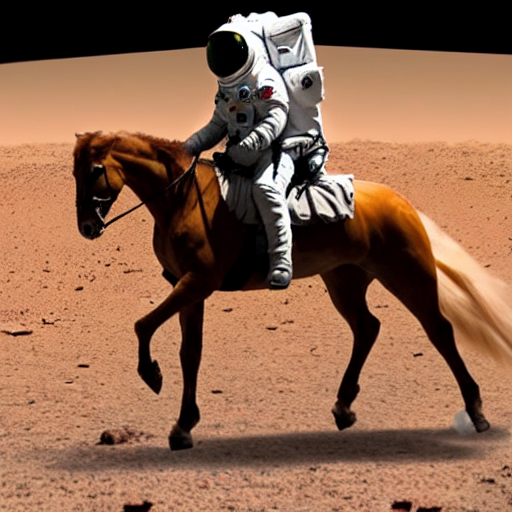

In [5]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = LMSDiscreteScheduler().from_config(pipeline.scheduler.config)
image_lmsds_100 = pipeline(prompt, generator=generator, num_inference_steps=100).images[0]
image_lmsds_100

### After 1000 steps

  0%|          | 0/1000 [00:00<?, ?it/s]

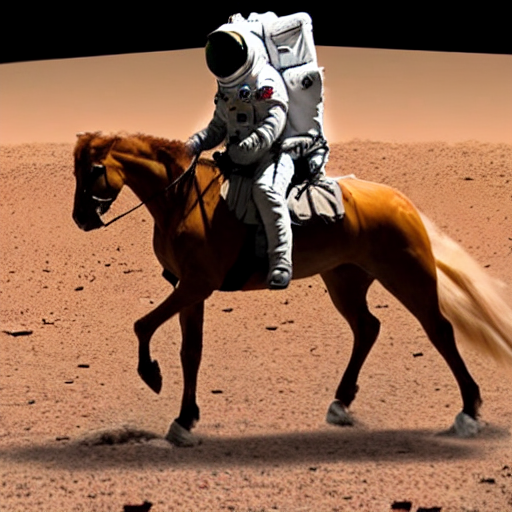

In [6]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = LMSDiscreteScheduler().from_config(pipeline.scheduler.config)
image_lmsds_1000 = pipeline(prompt, generator=generator, num_inference_steps=1000).images[0]
image_lmsds_1000

## EulerDiscreteScheduler

### After 10 steps

  0%|          | 0/10 [00:00<?, ?it/s]

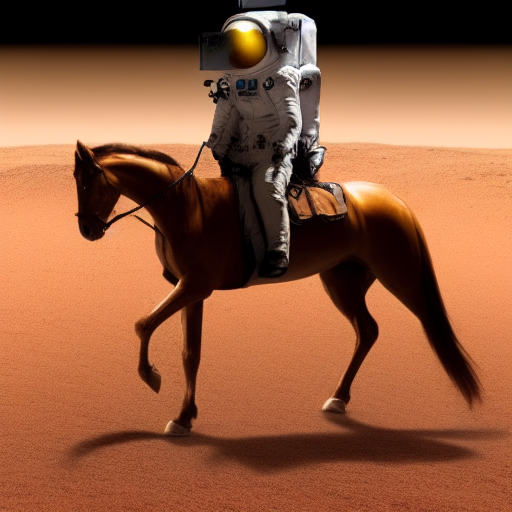

In [7]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eds_10 = pipeline(prompt, generator=generator, num_inference_steps=10).images[0]
image_eds_10

### After 100 steps

  0%|          | 0/100 [00:00<?, ?it/s]

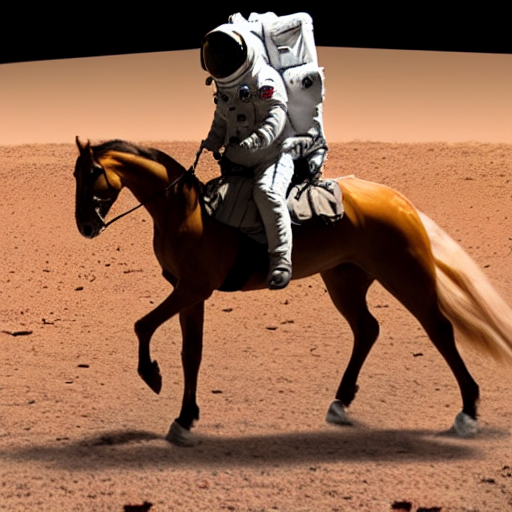

In [8]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eds_100 = pipeline(prompt, generator=generator, num_inference_steps=100).images[0]
image_eds_100

### After 1000 steps

  0%|          | 0/1000 [00:00<?, ?it/s]

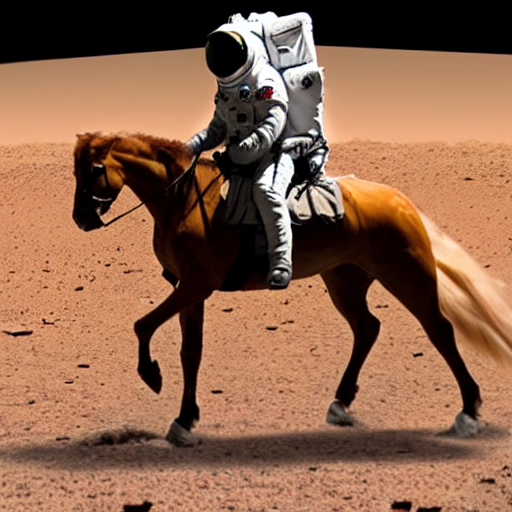

In [9]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eds_1000 = pipeline(prompt, generator=generator, num_inference_steps=1000).images[0]
image_eds_1000

## EulerAncestralDiscreteScheduler

### After 10 steps

  0%|          | 0/10 [00:00<?, ?it/s]

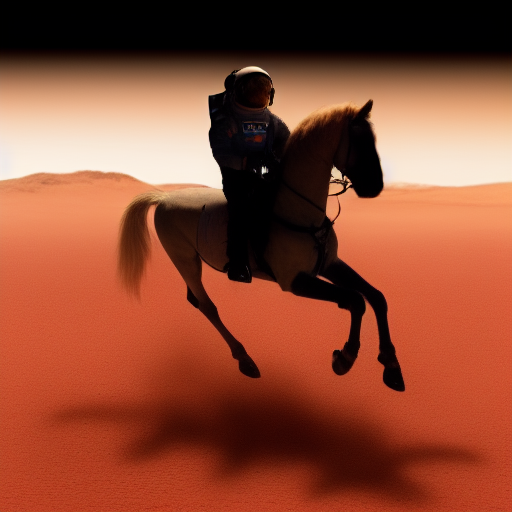

In [10]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eads_10 = pipeline(prompt, generator=generator, num_inference_steps=10).images[0]
image_eads_10

### After 100 steps

  0%|          | 0/100 [00:00<?, ?it/s]

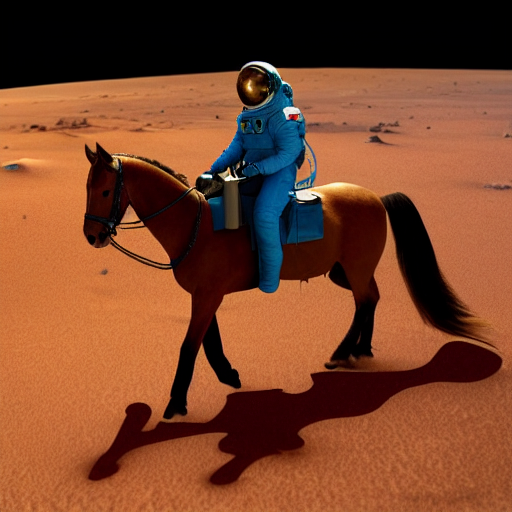

In [11]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eads_100 = pipeline(prompt, generator=generator, num_inference_steps=100).images[0]
image_eads_100

### After 1000 steps

  0%|          | 0/1000 [00:00<?, ?it/s]

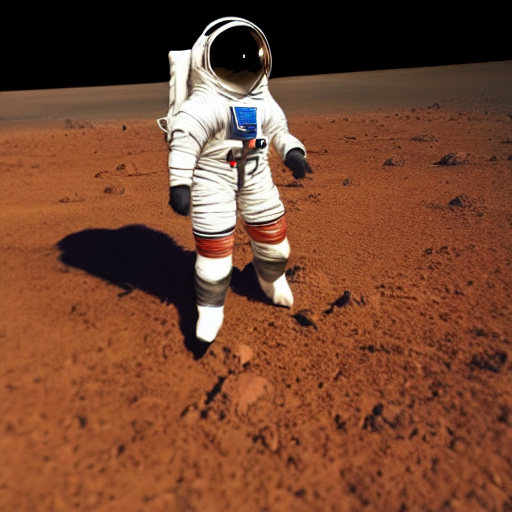

In [12]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
image_eads_1000 = pipeline(prompt, generator=generator, num_inference_steps=1000).images[0]
image_eads_1000

## DPMSolverMultistepScheduler

### After 10 steps

  0%|          | 0/10 [00:00<?, ?it/s]

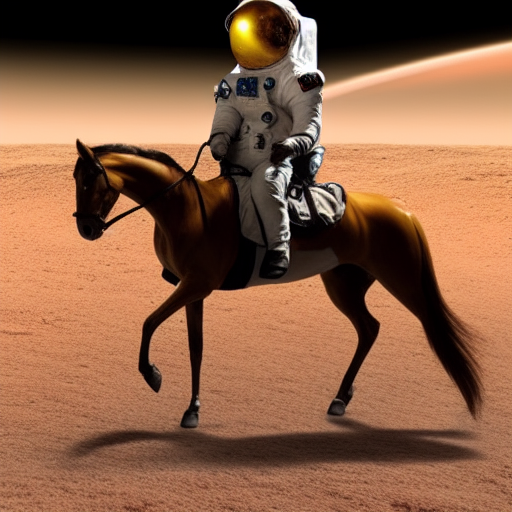

In [13]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
image_dpmsms_10 = pipeline(prompt, generator=generator, num_inference_steps=10).images[0]
image_dpmsms_10

### After 100 steps

  0%|          | 0/100 [00:00<?, ?it/s]

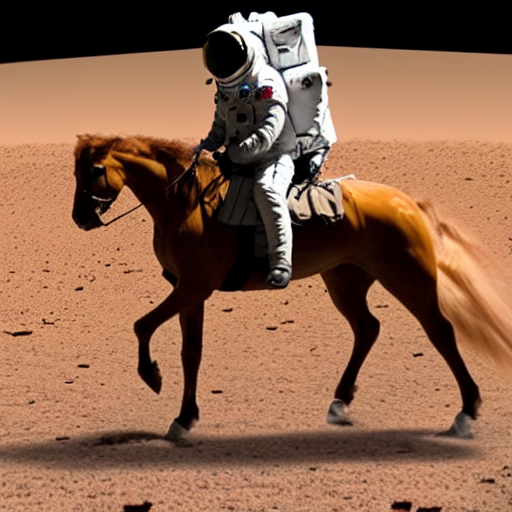

In [14]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
image_dpmsms_100 = pipeline(prompt, generator=generator, num_inference_steps=100).images[0]
image_dpmsms_100

### After 1000 steps

  0%|          | 0/1000 [00:00<?, ?it/s]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/diffusers/image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


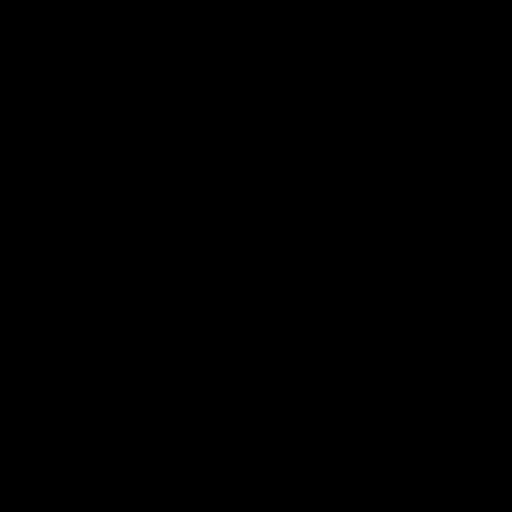

In [15]:
generator = torch.Generator().manual_seed(99)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
image_dpmsms_1000 = pipeline(prompt, generator=generator, num_inference_steps=1000).images[0]
image_dpmsms_1000

## Overview of all generated images

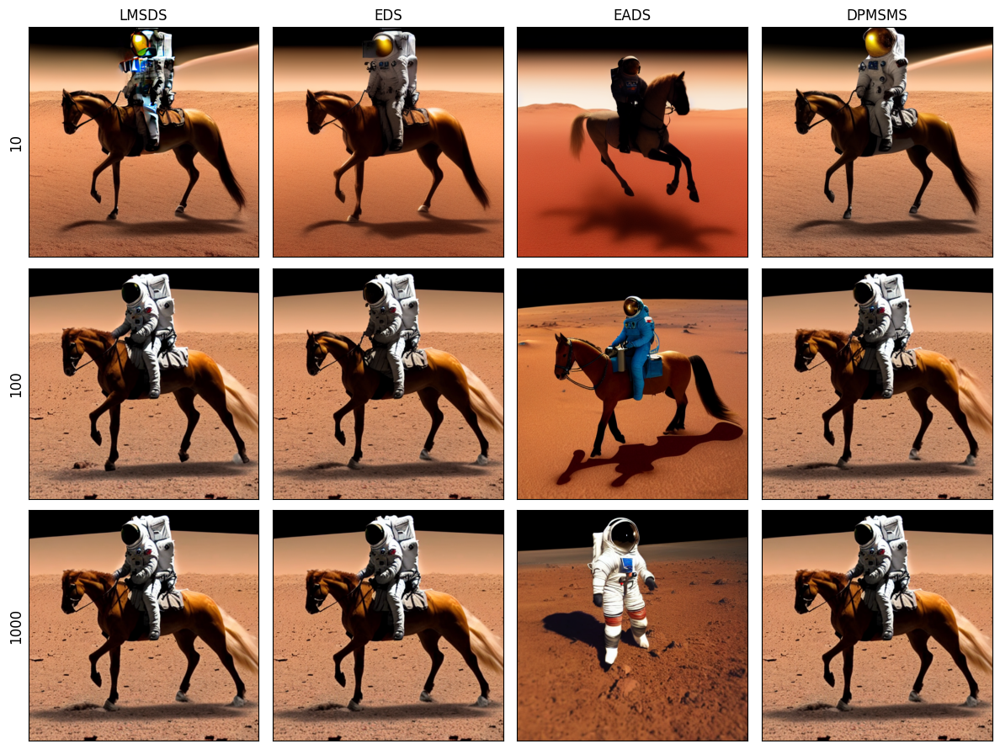

In [18]:
images = [image_lmsds_10, image_eds_10, image_eads_10, image_dpmsms_10, image_lmsds_100, image_eds_100, image_eads_100, image_dpmsms_100, image_lmsds_1000,
          image_eds_1000, image_eads_1000, image_lmsds_1000]

row_labels = [10, 100, 1000]
col_labels = ["LMSDS", "EDS", "EADS", "DPMSMS"]

fig, axes = plt.subplots(3, 4, figsize=(12, 9))
for i in range(3):  # 3 rows
    for j in range(4):  # 4 columns
        ax = axes[i, j]
        img_index = i * 4 + j
        
        img = images[img_index] 
        
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])

        if i == 0:
            ax.set_title(col_labels[j], fontsize=12)
        if j == 0:
            ax.set_ylabel(f"{row_labels[i]}", fontsize=12)

fig.tight_layout()
plt.show()

## Positive vs. negative prompt

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   6%|6         | 83.9M/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   2%|2         | 73.4M/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:  69%|######8   | 231M/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

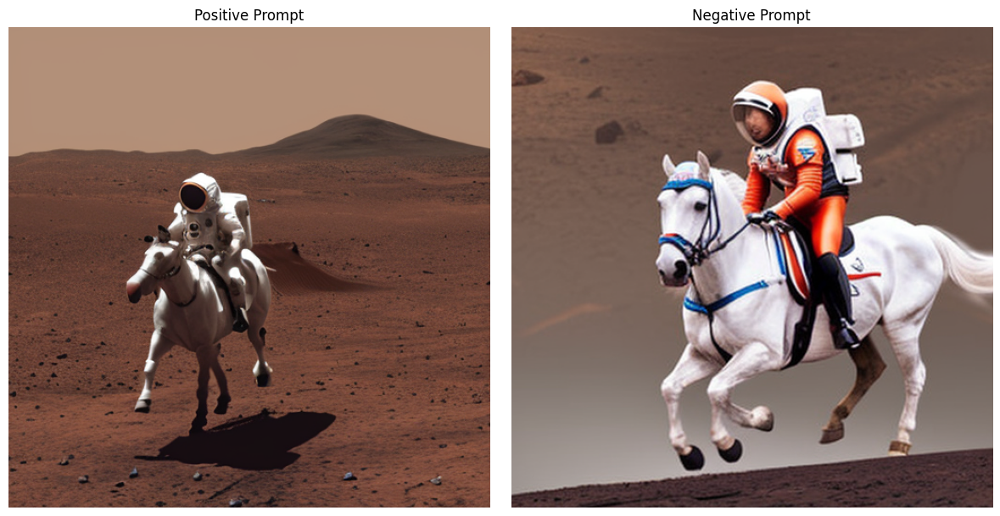

In [17]:
pipeline = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1-base", 
    torch_dtype=torch.float16
)
pipeline = pipeline.to("mps")

positive_prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."
negative_prompt = "desert"

generator = torch.Generator(device="mps").manual_seed(42)

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

image_with_positive_prompt = pipeline(
    prompt=positive_prompt, 
    generator=generator, 
    num_inference_steps=100
).images[0]

image_with_negative_prompt = pipeline(
    prompt=positive_prompt, 
    negative_prompt=negative_prompt, 
    generator=generator, 
    num_inference_steps=100
).images[0]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_with_positive_prompt)
axes[0].set_title("Positive Prompt")
axes[0].axis("off")

axes[1].imshow(image_with_negative_prompt)
axes[1].set_title("Negative Prompt")
axes[1].axis("off")

plt.tight_layout()
plt.show()

# 3. Natural Language Processing

In [1]:
from googletrans import Translator
translator = Translator()

In [2]:
path_to_utils = 'pyfiles'
import sys
sys.path.append(path_to_utils)
import nmt_dataset
import nnet_models as nnet_models
import numpy as np
import torch
import time
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from subword_nmt.apply_bpe import BPE

In [3]:
data_dir = 'data'
source_lang, target_lang = 'en', 'fr'
model_dir = 'models/{}-{}'.format(source_lang, target_lang)

In [4]:
def reset_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)

In [6]:
import os
bpe_path = os.path.join(data_dir, 'bpecodes.de-en-fr')

with open(bpe_path) as bpe_codes:
    bpe_model = BPE(bpe_codes)

def preprocess(line, is_source=True, source_lang=None, target_lang=None):
    return bpe_model.segment(line.lower())

def postprocess(line):
    return line.replace('@@ ', '')

def load_data(source_lang, target_lang, split='train', max_size=None):
    # max_size: max number of sentence pairs in the training corpus (None = all)
    path = os.path.join(data_dir, '{}.{}-{}'.format(split, *sorted([source_lang, target_lang])))
    return nmt_dataset.load_dataset(path, source_lang, target_lang, preprocess=preprocess, max_size=max_size)   # set max_size to 10000 for fast debugging

In [7]:
train_data = load_data(source_lang, target_lang, 'train', max_size=10000)   # set max_size to 10000 for fast debugging
valid_data = load_data(source_lang, target_lang, 'valid')
test_data = load_data(source_lang, target_lang, 'test')
print(train_data.iloc[:5])

                        source_data                        target_data  \
0                      you may go .        vous pouvez vous en aller .   
1  what medicine do you recommend ?     quel remède recommandez-vous ?   
2                 come back later .                reviens plus tard .   
3  money makes the world go round .  l' argent fait tourner le monde .   
4          he arrived at midnight .           il est arrivé à minuit .   

                               source_tokenized  \
0                             [you, may, go, .]   
1   [what, medicine, do, you, recomm@@, end, ?]   
2                        [come, back, later, .]   
3  [money, makes, the, world, go, r@@, ound, .]   
4            [he, arrived, at, mid@@, night, .]   

                                  target_tokenized  
0               [vous, pouvez, vous, en, aller, .]  
1  [quel, rem@@, ède, recomm@@, an@@, dez-vous, ?]  
2                     [re@@, viens, plus, tard, .]  
3    [l', argent, fait, tour@@, ner,

In [8]:
source_dict_path = os.path.join(model_dir, 'dict.{}.txt'.format(source_lang))
target_dict_path = os.path.join(model_dir, 'dict.{}.txt'.format(target_lang))

source_dict = nmt_dataset.load_or_create_dictionary(
    source_dict_path,
    train_data['source_tokenized'],
    minimum_count=10,
    reset=False    # set reset to True if you're changing the data or the preprocessing
)
print(source_dict.words[:100])

target_dict = nmt_dataset.load_or_create_dictionary(
    target_dict_path,
    train_data['target_tokenized'],
    minimum_count=10,
    reset=False
)
print(target_dict.words[:100])

['<sos>', '<eos>', '<unk>', '<pad>', '.', 'i', 'to', 'the', 'you', '?', 'a', "'s", ',', "'t", 'was', 'have', 'of', 'is', 'it', 'your', 'we', 'that', 'do', 'on', 'tom', 'in', 'are', 'be', 'he', 'for', 'don', '"', 'at', 'me', 'she', 'what', 'with', 'this', "'m", 'think', 'know', 'go', 'my', "'ll", 'time', 'out', "'re", 'not', 'can', 'his', 'they', 'want', 'her', 'how', 'all', 'when', 'and', 'there', 'going', 'one', 'more', 'than', 'ing', 'here', 'any', 'very', 'get', 'no', 'would', 'did', 'had', 'ed', 'about', 'where', 'like', "'ve", 's@@', 'who', 'right', 'didn', 'him', 'try', 'day', 'us', 'an', 'father', 'were', 'let', 'has', 'by', 'will', 'people', 'take', 'should', 'just', 'isn', 'tell', 'never', 'e@@', 'got']
['<sos>', '<eos>', '<unk>', '<pad>', '.', 'je', 'que', 'le', 'à', '?', 'pas', 'de', "l'", 'en', 'la', 'a', 'est', ',', 'vous', "j'", 'un', 'il', 'ne', "n'", 'ai', 'nous', "d'", 'une', 'votre', 'ce', 'tom', 'tu', 'pour', 'me', 'faire', 'ça', 'elle', 'du', 'suis', "c'", 'te', "qu

In [9]:
print('source vocab size:', len(source_dict))
print('target vocab size:', len(target_dict))

source vocab size: 1070
target vocab size: 1301


In [10]:
nmt_dataset.binarize(train_data, source_dict, target_dict, sort=True)
nmt_dataset.binarize(valid_data, source_dict, target_dict, sort=False)
nmt_dataset.binarize(test_data, source_dict, target_dict, sort=False)
print(train_data.iloc[:5])

        source_data         target_data   source_tokenized  \
691            go .          en route !            [go, .]   
2059    wonderful !            génial !     [wonderful, !]   
541     thank you .             merci .    [thank, you, .]   
9093    take care !         attention !    [take, care, !]   
268   talk slowly .  parlez lentement .  [talk, slowly, .]   

            target_tokenized         source_bin  source_len       target_bin  \
691           [en, route, !]         [41, 4, 1]           3   [13, 2, 51, 1]   
2059         [géni@@, al, !]        [2, 237, 1]           3  [2, 666, 51, 1]   
541               [merci, .]     [465, 8, 4, 1]           4      [495, 4, 1]   
9093          [attention, !]  [92, 409, 237, 1]           4    [1054, 51, 1]   
268   [parlez, lentement, .]   [178, 997, 4, 1]           4  [2, 1191, 4, 1]   

      target_len  
691            4  
2059           4  
541            3  
9093           3  
268            4  


In [11]:
max_len = 30       # Maximum 30 tokens per sentence (longer sequences will be truncated)
batch_size = 512   # Maximum 512 tokens per batch (decrease if you get OOM errors, increase to speed up training)

reset_seed()

train_iterator = nmt_dataset.BatchIterator(train_data, source_lang, target_lang, batch_size=batch_size, max_len=max_len, shuffle=True)
valid_iterator = nmt_dataset.BatchIterator(valid_data, source_lang, target_lang, batch_size=batch_size, max_len=max_len, shuffle=False)
test_iterator = nmt_dataset.BatchIterator(test_data, source_lang, target_lang, batch_size=batch_size, max_len=max_len, shuffle=False)

In [12]:
def save_model(model, checkpoint_path):
    dirname = os.path.dirname(checkpoint_path)
    if dirname:
        os.makedirs(dirname, exist_ok=True)
    torch.save(model, checkpoint_path)

def train_model(train_iterator, valid_iterators, model, checkpoint_path, epochs=1, validation_frequency=1):

    reset_seed()

    grads_encoder = {i: [] for i in range(len(model.encoder.layers))}
    grads_decoder = {i: [] for i in range(len(model.decoder.layers))}


    best_bleu = -1
    for epoch in range(1, epochs + 1):

        start = time.time()
        running_loss = 0

        print('Epoch: [{}/{}]'.format(epoch, epochs))

        # Iterate over training batches for one epoch
        for i, batch in tqdm(enumerate(train_iterator), total=len(train_iterator)):
            t = time.time()
            running_loss += model.train_step(batch)

            for j, layer in enumerate(model.encoder.layers):
                grads = []
                for param in layer.parameters():
                    if param.grad is not None:
                        grads.append(param.grad.norm().item())
                grads_encoder[j].append(sum(grads) / len(grads) if grads else 0)

            for j, layer in enumerate(model.decoder.layers):
                grads = []
                for param in layer.parameters():
                    if param.grad is not None:
                        grads.append(param.grad.norm().item())
                grads_decoder[j].append(sum(grads) / len(grads) if grads else 0)


        # Average training loss for this epoch
        epoch_loss = running_loss / len(train_iterator)

        print("loss={:.3f}, time={:.2f}".format(epoch_loss, time.time() - start))
        sys.stdout.flush()

        # Evaluate and save the model
        if epoch % validation_frequency == 0:
            bleu_scores = []
            
            # Compute BLEU over all validation sets
            for valid_iterator in valid_iterators:
                src, tgt = valid_iterator.source_lang, valid_iterator.target_lang
                translation_output = model.translate(valid_iterator, postprocess)
                bleu_score = translation_output.score
                output = translation_output.output

                with open(os.path.join(model_dir, 'valid.{}-{}.{}.out'.format(src, tgt, epoch)), 'w') as f:
                    f.writelines(line + '\n' for line in output)

                print('{}-{}: BLEU={}'.format(src, tgt, bleu_score))
                sys.stdout.flush()
                bleu_scores.append(bleu_score)

            # Average the validation BLEU scores
            bleu_score = round(sum(bleu_scores) / len(bleu_scores), 2)
            if len(bleu_scores) > 1:
                print('BLEU={}'.format(bleu_score))

            # Update the model's learning rate based on current performance.
            # This scheduler divides the learning rate by 10 if BLEU does not improve.
            model.scheduler_step(bleu_score)

            # Save a model checkpoint if it has the best validation BLEU so far
            if bleu_score > best_bleu:
                best_bleu = bleu_score
                save_model(model, checkpoint_path)

        print('=' * 50)

    print("Training completed. Best BLEU is {}".format(best_bleu))
    return grads_encoder, grads_encoder

In [13]:
def get_binned_bleu_scores(model, valid_iterator):
    # Compute and plot BLEU scores according to sequence length
    # lengths = np.arange(0, 31, 5)
    lengths = np.arange(4, 20, 3)
    bleu_scores = np.zeros(len(lengths))

    for i in tqdm(range(1, len(lengths)), total=len(lengths) - 1):
        min_len = lengths[i - 1]
        max_len = lengths[i]

        tmp_data = valid_data[(valid_iterator.data['source_len'] > min_len) & (valid_iterator.data['source_len'] <= max_len)]
        tmp_iterator = nmt_dataset.BatchIterator(tmp_data, source_lang, target_lang, batch_size, max_len=max_len)

        bleu_scores[i] = model.translate(tmp_iterator, postprocess).score

    lengths = lengths[1:]
    bleu_scores = bleu_scores[1:]

    plt.plot(lengths, bleu_scores, 'x-')
    plt.ylim(0, np.max(bleu_scores) + 1)
    plt.xlabel('Source length')
    plt.ylabel('BLEU score')
    
    return lengths, bleu_scores


def show_attention(input_sentence, output_words, attentions):
    # Plot an encoder-decoder attention matrix
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(attentions, cmap='bone', aspect='auto')
    fig.colorbar(cax)

    ax.set_xticklabels([''] + input_sentence.split(' ') +
                       [nmt_dataset.EOS_TOKEN], rotation=90)
    ax.set_yticklabels([''] + output_words.split(' ') +
                       [nmt_dataset.EOS_TOKEN])

    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    plt.show()


def encode_as_batch(sentence, dictionary, source_lang, target_lang):
    # Create a batch from a single sentence
    sentence = sentence + ' ' + nmt_dataset.EOS_TOKEN
    tensor = dictionary.txt2vec(sentence).unsqueeze(0)

    return {
        'source': tensor,
        'source_len': torch.from_numpy(np.array([tensor.shape[-1]])),
        'source_lang': source_lang,
        'target_lang': target_lang
    }


def get_translation(model, sentence, dictionary, source_lang, target_lang, return_output=False):
    # Translate given sentence with given model. Also show translation outputs by Google Translate for comparison.
    print('Source:', sentence)
    sentence_tok = preprocess(sentence, is_source=True, source_lang=source_lang, target_lang=target_lang)
    print('Tokenized source:', sentence_tok)
    batch = encode_as_batch(sentence_tok, dictionary, source_lang, target_lang)
    prediction, attn_matrix, enc_self_attn = model.eval_step(batch)
    prediction = prediction[0]
    prediction_detok = postprocess(prediction)
    print('Prediction:', prediction)
    print('Detokenized prediction:', prediction_detok)
    
    print('Google Translate ({}->{}): {}'.format(
        source_lang,
        target_lang,
        translator.translate(sentence, src=source_lang, dest=target_lang).text
    ))
    
    print('Google Translate on prediction ({}->{}): {}'.format(
        target_lang,
        source_lang,
        translator.translate(prediction_detok, src=target_lang, dest=source_lang).text
    ))
    
    results = {
        'source': sentence,
        'source_tokens': sentence_tok.split(' ') + ['<eos>'],
        'prediction_detok': prediction_detok,
        'prediction_tokens': prediction.split(' '),
    }

    if attn_matrix is not None:
        attn_matrix = attn_matrix[0].detach().cpu().numpy()
        results['attention_matrix'] = attn_matrix
        show_attention(sentence_tok, prediction, attn_matrix)
    
    if enc_self_attn is not None:
        results['encoder_self_attention_list'] = enc_self_attn
    
    if return_output:
        return results

In [14]:
# Initialize the encoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
num_layers = 5
normalize_before = False
transformer_encoder = nnet_models.TransformerEncoder(
    input_size=len(source_dict),
    hidden_size=64,
    num_layers=num_layers,
    dropout=0.0,
    heads=4,
    normalize_before=normalize_before,
)

# Initialize the decoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
transformer_decoder = nnet_models.TransformerDecoder(
    output_size=len(target_dict),
    hidden_size=64,
    num_layers=num_layers,
    heads=4,
    dropout=0.0,
    normalize_before=normalize_before,
)

transformer_model = nnet_models.EncoderDecoder(
    transformer_encoder,
    transformer_decoder,
    lr=0.001,
    use_cuda=True,
    target_dict=target_dict,
)
# Set this value to True to train your own model. By default, a pre-trained model will be loaded.
# Tip: you can set "epoch" to a small value (e.g., 2) and re-run this cell several times to continue training you model (`train_model` does not reset the model)
train_again = True

if train_again:
    checkpoint_path = os.path.join(model_dir, 'transformer.pt')
else:
    checkpoint_path = os.path.join(model_dir, 'pretrained-transformer.pt')

print('checkpoint path:', checkpoint_path)
grads_encoder, grads_decoder = train_model(train_iterator, [valid_iterator], transformer_model,
                epochs=2,
                checkpoint_path=checkpoint_path)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


checkpoint path: models/en-fr/transformer.pt
Epoch: [1/2]


100%|██████████| 211/211 [00:07<00:00, 27.92it/s]

loss=4.594, time=7.57



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=4.28
Epoch: [2/2]


100%|██████████| 211/211 [00:07<00:00, 26.85it/s]

loss=3.679, time=7.86



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=7.08
Training completed. Best BLEU is 7.08


Text(0, 0.5, 'Gradient norm')

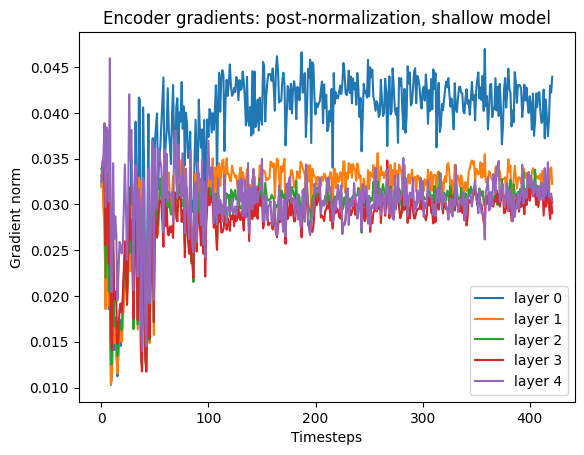

In [15]:
# Plot grads from grads encoder
for i in range(len(transformer_encoder.layers)):
    plt.plot(grads_encoder[i], label=f'layer {i}')

plt.legend()
plt.title('Encoder gradients: post-normalization, shallow model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

Text(0, 0.5, 'Gradient norm')

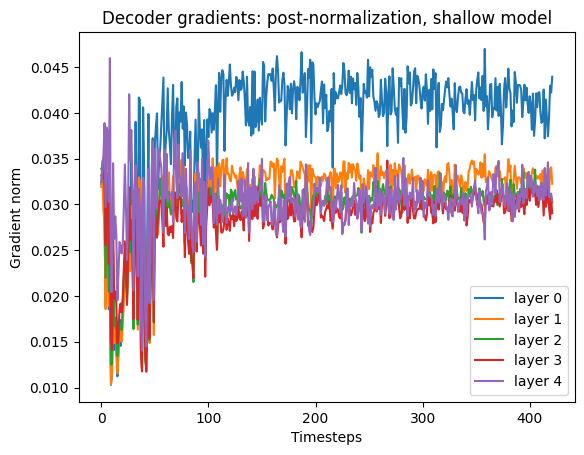

In [16]:
# Plot grads from grads decoder
for i in range(len(transformer_decoder.layers)):
    plt.plot(grads_decoder[i], label=f'layer {i}')

plt.legend()
plt.title('Decoder gradients: post-normalization, shallow model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

In [17]:
# Initialize the encoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
num_layers = 5
normalize_before = True
transformer_encoder = nnet_models.TransformerEncoder(
    input_size=len(source_dict),
    hidden_size=64,
    num_layers=num_layers,
    dropout=0.0,
    heads=4,
    normalize_before=normalize_before,
)

# Initialize the decoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
transformer_decoder = nnet_models.TransformerDecoder(
    output_size=len(target_dict),
    hidden_size=64,
    num_layers=num_layers,
    heads=4,
    dropout=0.0,
    normalize_before=normalize_before,
)

transformer_model = nnet_models.EncoderDecoder(
    transformer_encoder,
    transformer_decoder,
    lr=0.001,
    use_cuda=True,
    target_dict=target_dict,
)

# Set this value to True to train your own model. By default, a pre-trained model will be loaded.
# Tip: you can set "epoch" to a small value (e.g., 2) and re-run this cell several times to continue training you model (`train_model` does not reset the model)

train_again = True

if train_again:
    checkpoint_path = os.path.join(model_dir, 'transformer.pt')
else:
    checkpoint_path = os.path.join(model_dir, 'pretrained-transformer.pt')

print('checkpoint path:', checkpoint_path)
grads_encoder, grads_decoder = train_model(train_iterator, [valid_iterator], transformer_model,
                epochs=2,
                checkpoint_path=checkpoint_path)

checkpoint path: models/en-fr/transformer.pt
Epoch: [1/2]


100%|██████████| 211/211 [00:08<00:00, 24.61it/s]

loss=4.459, time=8.57



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=5.78
Epoch: [2/2]


100%|██████████| 211/211 [00:08<00:00, 24.84it/s]

loss=3.461, time=8.49



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=8.33
Training completed. Best BLEU is 8.33


Text(0, 0.5, 'Gradient norm')

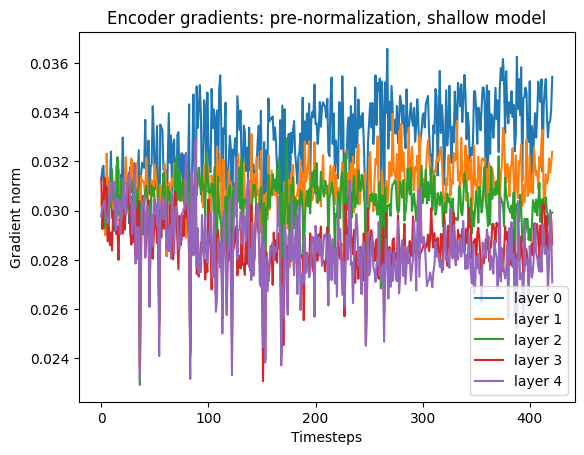

In [18]:
# Plot grads from grads encoder
for i in range(len(transformer_encoder.layers)):
    plt.plot(grads_encoder[i], label=f'layer {i}')

plt.legend()
plt.title('Encoder gradients: pre-normalization, shallow model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

Text(0, 0.5, 'Gradient norm')

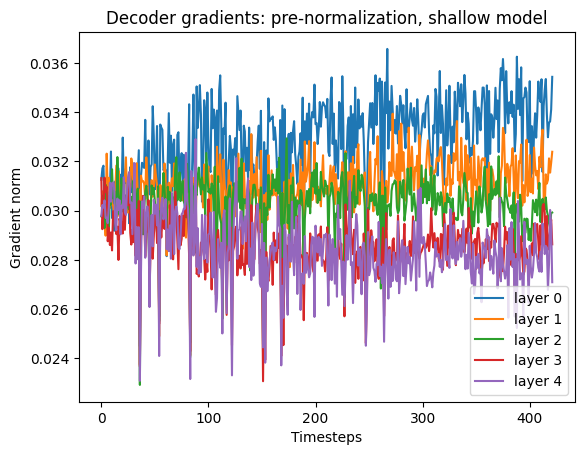

In [19]:
# Plot grads from grads decoder
for i in range(len(transformer_decoder.layers)):
    plt.plot(grads_decoder[i], label=f'layer {i}')

plt.legend()
plt.title('Decoder gradients: pre-normalization, shallow model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

In [20]:
# Initialize the encoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
num_layers = 12
normalize_before = False
transformer_encoder = nnet_models.TransformerEncoder(
    input_size=len(source_dict),
    hidden_size=64,
    num_layers=num_layers,
    dropout=0.0,
    heads=4,
    normalize_before=normalize_before,
)

# Initialize the decoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
transformer_decoder = nnet_models.TransformerDecoder(
    output_size=len(target_dict),
    hidden_size=64,
    num_layers=num_layers,
    heads=4,
    dropout=0.0,
    normalize_before=normalize_before,
)

transformer_model = nnet_models.EncoderDecoder(
    transformer_encoder,
    transformer_decoder,
    lr=0.001,
    use_cuda=True,
    target_dict=target_dict,
)

# Set this value to True to train your own model. By default, a pre-trained model will be loaded.
# Tip: you can set "epoch" to a small value (e.g., 2) and re-run this cell several times to continue training you model (`train_model` does not reset the model)
train_again = True

if train_again:
    checkpoint_path = os.path.join(model_dir, 'transformer.pt')
else:
    checkpoint_path = os.path.join(model_dir, 'pretrained-transformer.pt')

print('checkpoint path:', checkpoint_path)
grads_encoder, grads_decoder = train_model(train_iterator, [valid_iterator], transformer_model,
                epochs=2,
                checkpoint_path=checkpoint_path)

checkpoint path: models/en-fr/transformer.pt
Epoch: [1/2]


100%|██████████| 211/211 [00:18<00:00, 11.42it/s]

loss=4.885, time=18.48



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=1.84
Epoch: [2/2]


100%|██████████| 211/211 [00:19<00:00, 10.81it/s]

loss=4.017, time=19.53



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=3.4
Training completed. Best BLEU is 3.4


Text(0, 0.5, 'Gradient norm')

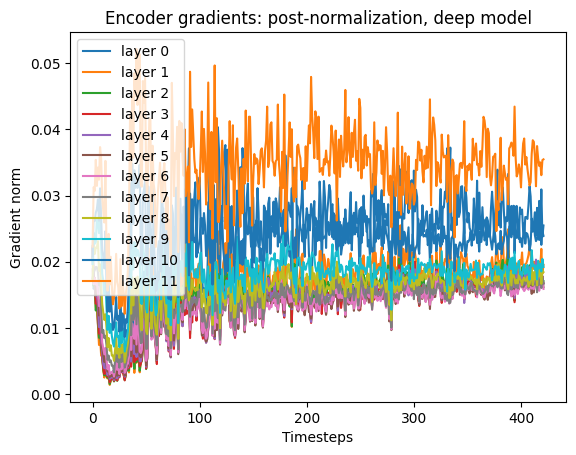

In [21]:
# Plot grads from grads encoder
for i in range(len(transformer_encoder.layers)):
    plt.plot(grads_encoder[i], label=f'layer {i}')

plt.legend()
plt.title('Encoder gradients: post-normalization, deep model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

Text(0, 0.5, 'Gradient norm')

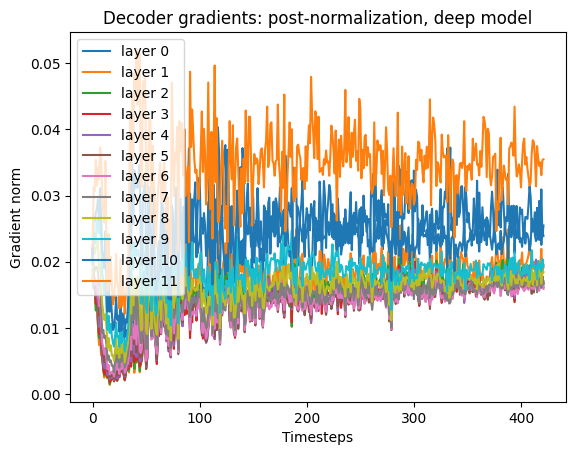

In [22]:
# Plot grads from grads decoder
for i in range(len(transformer_decoder.layers)):
    plt.plot(grads_decoder[i], label=f'layer {i}')

plt.legend()
plt.title('Decoder gradients: post-normalization, deep model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

In [23]:
# Initialize the encoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
num_layers = 12
normalize_before = True
transformer_encoder = nnet_models.TransformerEncoder(
    input_size=len(source_dict),
    hidden_size=64,
    num_layers=num_layers,
    dropout=0.0,
    heads=4,
    normalize_before=normalize_before,
)

# Initialize the decoder of a transfomer model with 1 layer of hidden size 512, 4 heads and dropout of 0
transformer_decoder = nnet_models.TransformerDecoder(
    output_size=len(target_dict),
    hidden_size=64,
    num_layers=num_layers,
    heads=4,
    dropout=0.0,
    normalize_before=normalize_before,
)

transformer_model = nnet_models.EncoderDecoder(
    transformer_encoder,
    transformer_decoder,
    lr=0.001,
    use_cuda=True,
    target_dict=target_dict,
)

# Set this value to True to train your own model. By default, a pre-trained model will be loaded.
# Tip: you can set "epoch" to a small value (e.g., 2) and re-run this cell several times to continue training you model (`train_model` does not reset the model)
train_again = True

if train_again:
    checkpoint_path = os.path.join(model_dir, 'transformer.pt')
else:
    checkpoint_path = os.path.join(model_dir, 'pretrained-transformer.pt')

print('checkpoint path:', checkpoint_path)
grads_encoder, grads_decoder = train_model(train_iterator, [valid_iterator], transformer_model,
                epochs=2,
                checkpoint_path=checkpoint_path)

checkpoint path: models/en-fr/transformer.pt
Epoch: [1/2]


100%|██████████| 211/211 [00:20<00:00, 10.14it/s]

loss=4.528, time=20.82



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=6.48
Epoch: [2/2]


100%|██████████| 211/211 [00:19<00:00, 10.70it/s]

loss=3.327, time=19.72



That's 100 lines that end in a tokenized period ('.')
It looks like you forgot to detokenize your test data, which may hurt your score.
If you insist your data is detokenized, or don't care, you can suppress this message with the `force` parameter.


en-fr: BLEU=8.68
Training completed. Best BLEU is 8.68


Text(0, 0.5, 'Gradient norm')

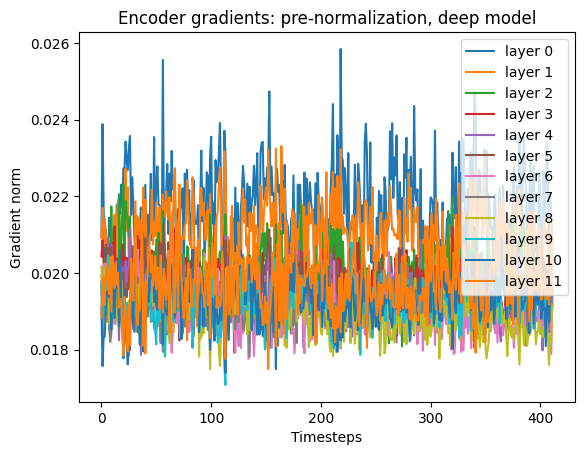

In [24]:
# Plot grads from grads encoder
for i in range(len(transformer_encoder.layers)):
    plt.plot(grads_encoder[i][10:], label=f'layer {i}')

plt.legend()
plt.title('Encoder gradients: pre-normalization, deep model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")

Text(0, 0.5, 'Gradient norm')

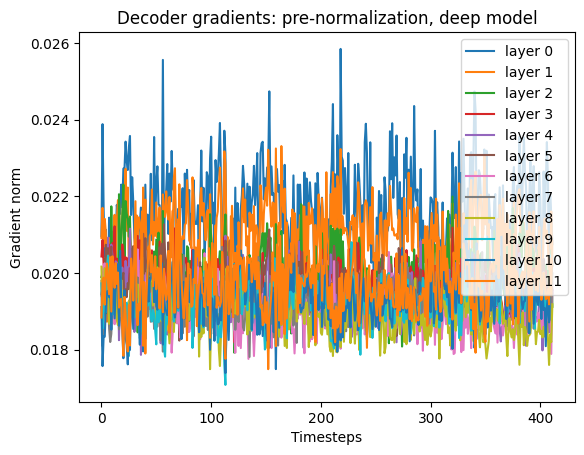

In [25]:
# Plot grads from grads decoder
for i in range(len(transformer_decoder.layers)):
    plt.plot(grads_decoder[i][10:], label=f'layer {i}')

plt.legend()
plt.title('Decoder gradients: pre-normalization, deep model')
plt.xlabel("Timesteps")
plt.ylabel("Gradient norm")